<a href="https://colab.research.google.com/github/erikycd/Flujo_optico/blob/main/Proyecto_FlujoOptico_2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Stage 1: Instalación de librerias y pre-procesamiento

In [ ]:
## Instalar las librerias

#!pip install opencv-python
#!pip install opencv-python-headless

In [ ]:
#### Lectura de las imágenes

import cv2
import os
import matplotlib.pyplot as plt
import numpy as np

# Función de cargar y convertir
def load_and_convert_images(input_folder):

    gray_images = {}
    original_images = {}

    file_names = os.listdir(input_folder)
    file_names.sort()

    for filename in file_names:
        if filename.lower().endswith(('png', 'jpg', 'jpeg')):
            input_path = os.path.join(input_folder, filename)

            # Cargar la imagen
            image = cv2.imread(input_path)
            original_images[filename] = image

            # Convertir a escala de grises
            gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

            # Guardar en variable de tipo diccionario
            gray_images[filename] = gray

    return file_names, original_images, gray_images


# Función de visualización
def visualize_gray(filename, original_images, gray_images):

    original = original_images[filename]
    gray = gray_images[filename]

    plt.figure(figsize = (20, 10))

    plt.subplot(1, 2, 1)
    plt.imshow(cv2.cvtColor(original, cv2.COLOR_BGR2RGB))
    plt.title(f'Imagen Original {filename}')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(gray, cmap = 'gray')
    plt.title('Imagen en Escala de Grises')
    plt.axis('off')

    plt.show()


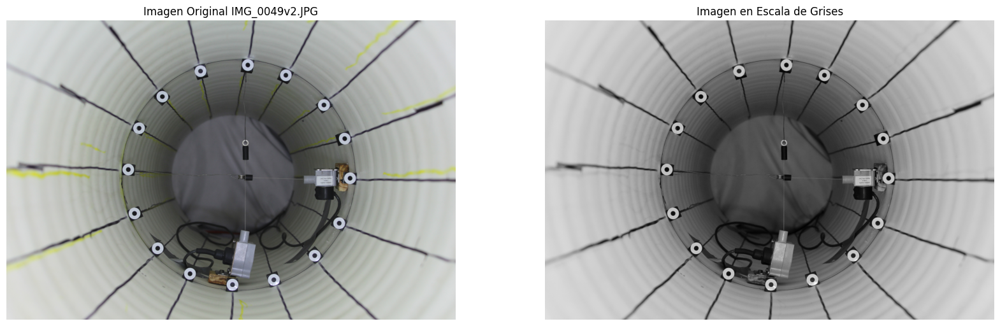

In [ ]:
#### Conversión a niveles de gris y visualización

filename, original_images, gray_images = load_and_convert_images('images')
visualize_gray(filename[1], original_images, gray_images)

# Stage 2: Umbralización por Otsu

In [ ]:
def threshold_images(gray_images, method):
    thresholded_images = {}

    for filename, gray in gray_images.items():
        if method == 'umbral':
            _, binary = cv2.threshold(gray, 100, 255, cv2.THRESH_BINARY)

        elif method == 'adaptativo':
            binary = cv2.adaptiveThreshold(gray, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 2)

        elif method == 'otsu':
            _, binary = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY+cv2.THRESH_OTSU)

        thresholded_images[filename] = binary

    return thresholded_images

def visualize_thresh(filename, original_images, gray_images, thresholded_images):

    original = original_images[filename]
    gray = gray_images[filename]
    thresh = thresholded_images[filename]

    plt.figure(figsize = (20, 10))

    plt.subplot(1, 3, 1)
    plt.imshow(cv2.cvtColor(original, cv2.COLOR_BGR2RGB))
    plt.title(f'Imagen Original {filename}')
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(gray, cmap = 'gray')
    plt.title('Imagen en Escala de Grises')
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(thresh, cmap = 'gray')
    plt.title('Imagen Umbralizada')
    plt.axis('off')

    plt.show()

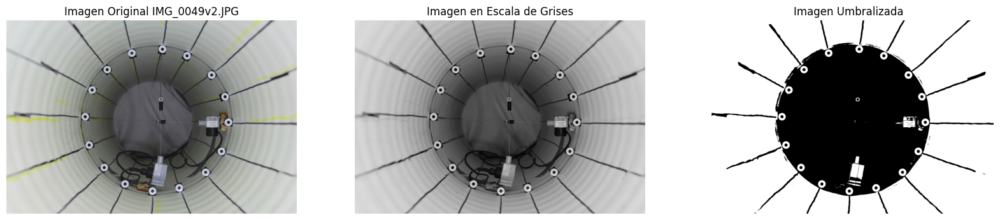

In [ ]:
#### Umbralización por OTSU

thresholded_images = threshold_images(gray_images, method = 'otsu')
visualize_thresh(filename[1], original_images, gray_images, thresholded_images)

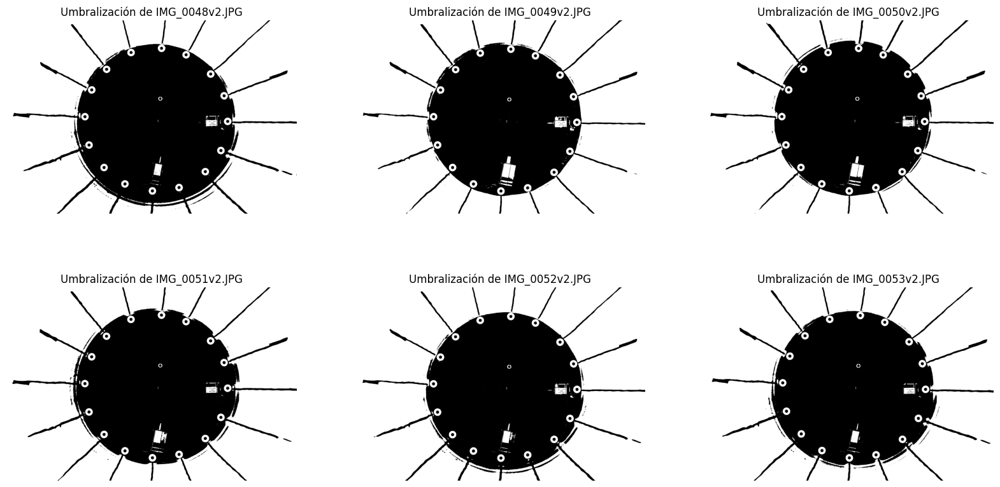

In [ ]:
def visualize_all(thresholded_images):

    i = 1
    plt.figure(figsize = (20, 10))

    for filename, binary in thresholded_images.items():

        plt.subplot(2, 3, i)
        plt.imshow(binary, cmap='gray')
        plt.title(f'Umbralización de {filename}')
        plt.axis('off')
        i = i + 1

    plt.show()

visualize_all(thresholded_images)

# Stage 3. Transformada de Hough

Para la detección de circulos en las imagenes

In [ ]:
def detect_circles(thresholded_images):

    detected_circles = {}

    for filename, binary in thresholded_images.items():
        circles = cv2.HoughCircles(binary, cv2.HOUGH_GRADIENT, dp=1.2, minDist=10,
                                   param1=50, param2=30, minRadius=5, maxRadius=30)

        if circles is not None:
            detected_circles[filename] = circles[0, :]
        else:
            detected_circles[filename] = []

    return detected_circles

def visualize_circles(original_images, detected_circles):

    i = 1
    plt.figure(figsize = (20, 10))

    for filename, circles in detected_circles.items():
        image = original_images[filename].copy()

        if len(circles) > 0:
            for circle in circles:
                x, y, r = int(circle[0]), int(circle[1]), int(circle[2])
                cv2.circle(image, (x, y), r, (0, 255, 0), 2)
                #cv2.circle(image, (x, y), 2, (0, 0, 255), 3)

        #plt.figure(figsize=(6, 6))
        plt.subplot(2, 3, i)
        plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
        plt.title(f'Círculos Detectados en {filename}')
        plt.axis('off')
        i = i + 1
    plt.show()

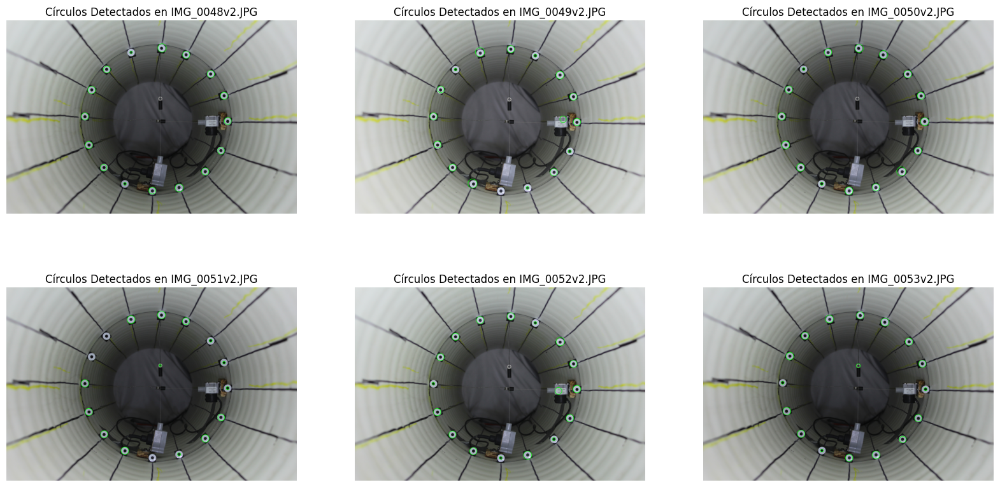

In [ ]:
#### Detección de circulos mediante la transformada de Hough

detected_circles = detect_circles(thresholded_images)
visualize_circles(original_images, detected_circles)

# Stage 4: Flujo óptico

Mas información sobre el flujo
 de Gunnar-Farneback: https://www.geeksforgeeks.org/opencv-the-gunnar-farneback-optical-flow/

In [ ]:
#### Calculo del flujo optico para las imagenes en escala de gris

def compute_OF(images):

    filenames = sorted(images.keys())
    flow_results = {}

    for i in range(len(filenames) - 1):
        file1, file2 = filenames[i], filenames[i + 1]
        prev_image, next_image = images[file1], images[file2]

        flow = cv2.calcOpticalFlowFarneback(prev_image, next_image, None, 0.5, 3, 15, 3, 5, 1.2, 0)
        flow_results[(file1, file2)] = flow

    return flow_results

flow_results = compute_OF(gray_images)

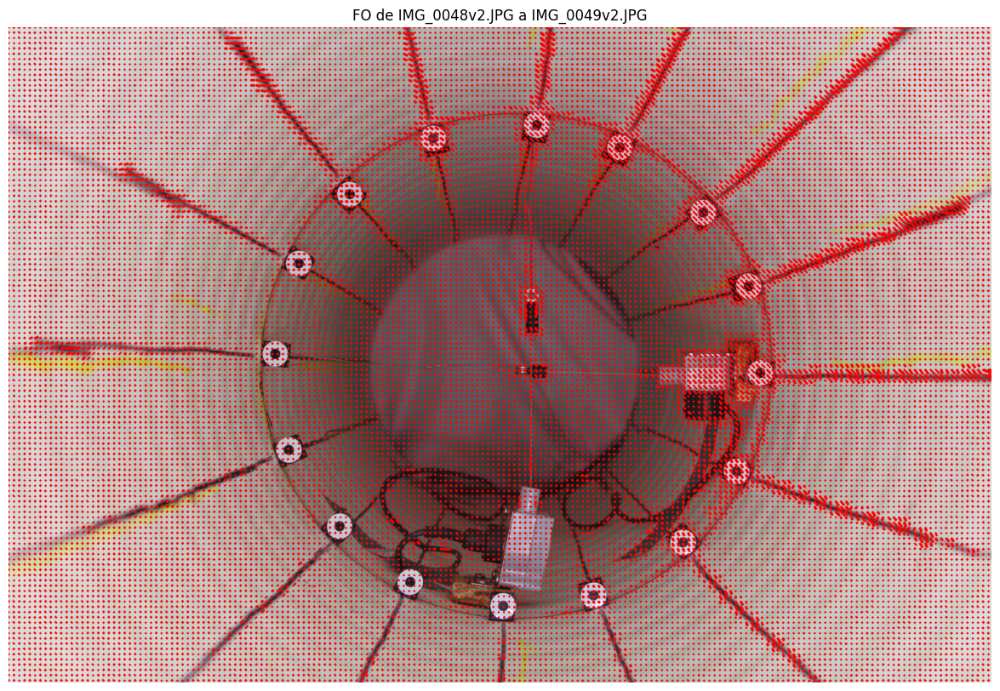

In [ ]:
#### Visualización del flujo para dos imagenes consecutivas

def visualize_OF_single(original_images, flow_results):

    file_1, file_2 = list(flow_results.keys())[0]
    flow_single = flow_results[file_1, file_2]

    #print(f"Selected flow data for image pair: {file_1, file_2}")
    #print(f"Shape of the flow data: {first_image_flow.shape}")

    image = original_images[file_2].copy()
    h, w = flow_single.shape[:2]
    step = 10  # Espaciado entre líneas del flujo óptico

    for y in range(0, h, step):
        for x in range(0, w, step):
            fx, fy = flow_single[y, x]
            cv2.line(image, (x, y), (int(x + fx), int(y + fy)), (0, 0, 255), 3)
            cv2.circle(image, (int(x + fx), int(y + fy)), 1, (0, 0, 255), -1)

    plt.figure(figsize = (20, 10))
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.title(f'FO de {file_1} a {file_2}')
    plt.axis('off')
    plt.show()

visualize_OF_single(original_images, flow_results)

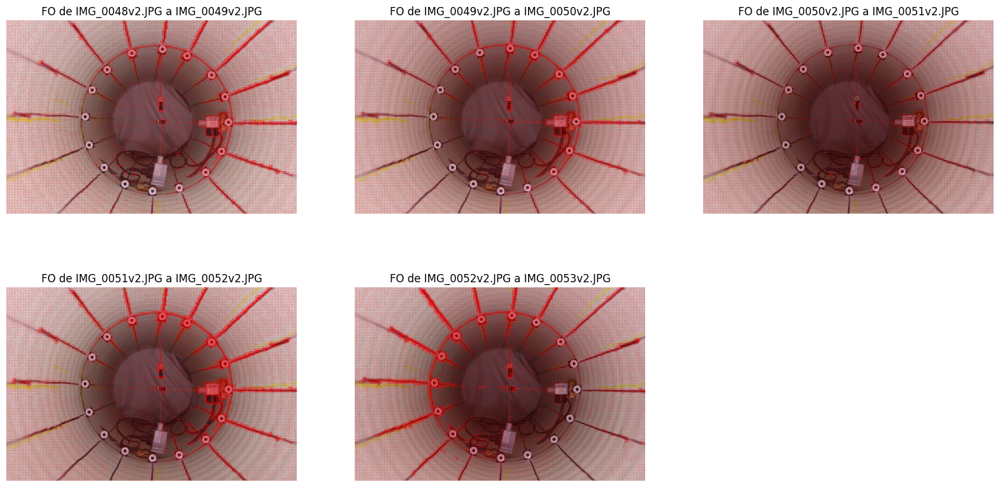

In [ ]:
#### Visualizacion del flujo para todas las imagenes en pares

def visualize_OF(original_images, flow_results):

    i = 1
    plt.figure(figsize = (20, 10))

    for (file1, file2), flow in flow_results.items():
        image = original_images[file2].copy()
        h, w = flow.shape[:2]
        step = 10  # Espaciado entre líneas del flujo óptico

        for y in range(0, h, step):
            for x in range(0, w, step):
                fx, fy = flow[y, x]
                cv2.line(image, (x, y), (int(x + fx), int(y + fy)), (0, 0, 255), 3)
                cv2.circle(image, (int(x + fx), int(y + fy)), 1, (0, 0, 255), -1)

        plt.subplot(2, 3, i)
        plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
        plt.title(f'FO de {file1} a {file2}')
        plt.axis('off')
        i = i + 1
    plt.show()

visualize_OF(original_images, flow_results)

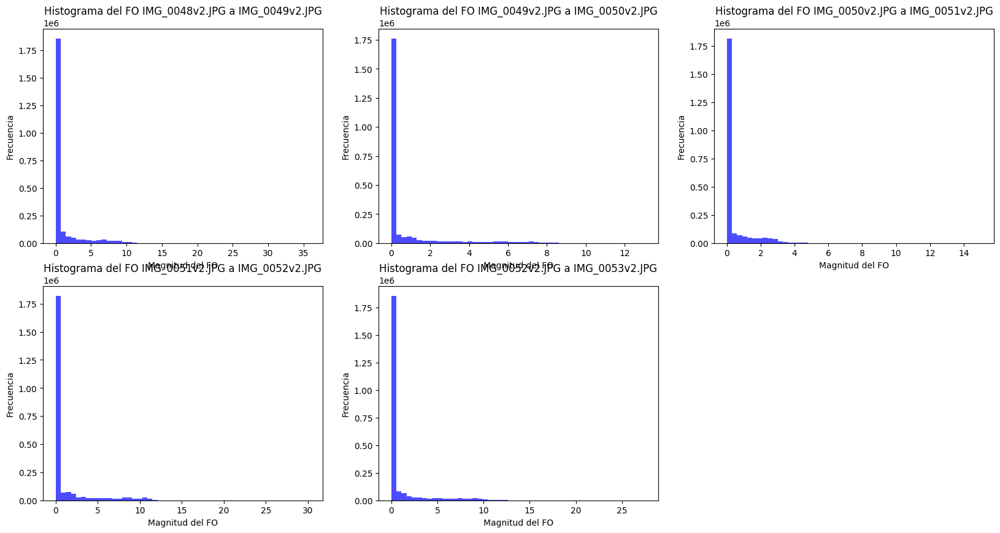

In [ ]:
#### Histograma de magnitud de desplazamiento del FO

def plot_OF_histogram(flow_results):

    i = 1
    plt.figure(figsize = (20, 10))

    for (file1, file2), flow in flow_results.items():
        magnitudes = np.sqrt(flow[..., 0]**2 + flow[..., 1]**2).flatten()

        plt.subplot(2, 3, i)
        plt.hist(magnitudes, bins=50, color='blue', alpha=0.7)
        plt.xlabel('Magnitud del FO')
        plt.ylabel('Frecuencia')
        plt.title(f'Histograma del FO {file1} a {file2}')
        i = i + 1
    plt.show()

plot_OF_histogram(flow_results)

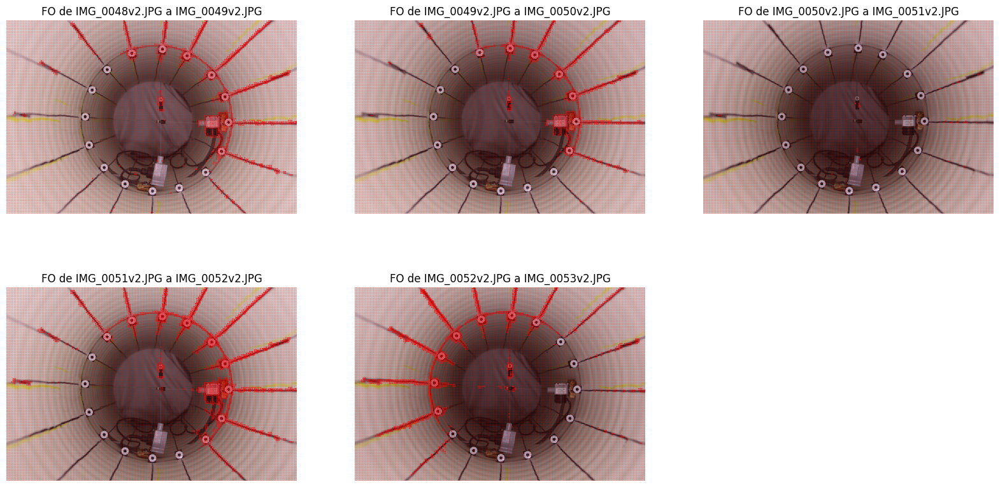

In [ ]:
#### Filtrado del FO para magnitudes mayores a cierto umbral=5

import numpy as np

def filter_OF(flow_results, threshold):
    filtered_flow = {}

    for key, flow in flow_results.items():
        magnitudes = np.sqrt(flow[..., 0]**2 + flow[..., 1]**2)
        zeros_array = np.zeros_like(flow)
        filtered_flow[key] = np.where(magnitudes[..., None] >= threshold, flow, zeros_array)

    return filtered_flow

filtered_flow = filter_OF(flow_results, threshold = 5)
visualize_OF(original_images, filtered_flow)

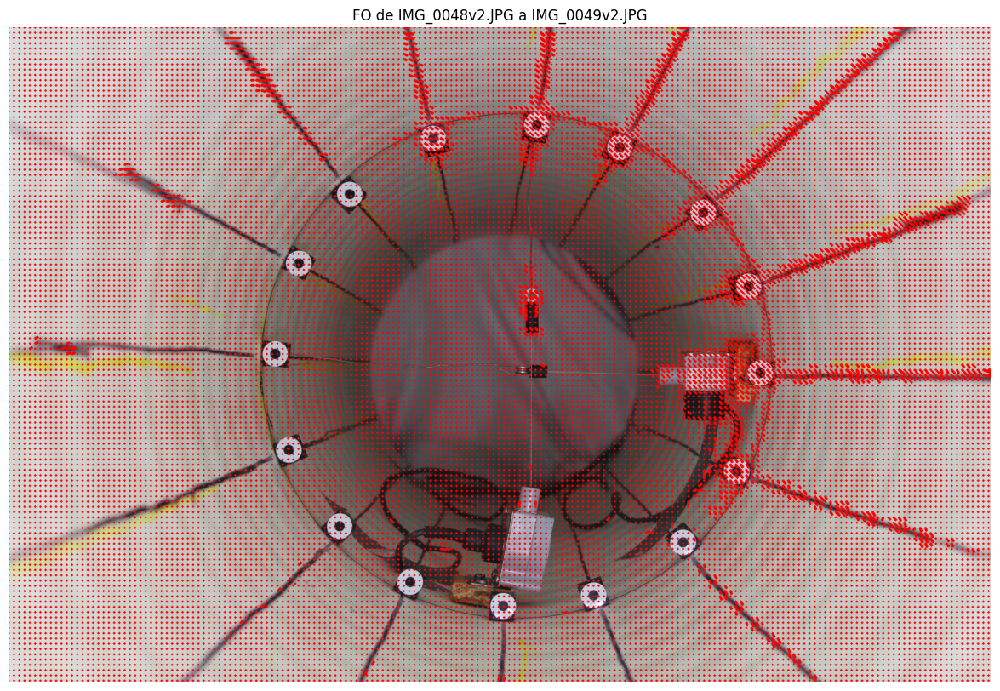

In [ ]:
#### Visualización del FO filtrado en una imagen

visualize_OF_single(original_images, filtered_flow)

# Stage 5. Cuantización del movimiento

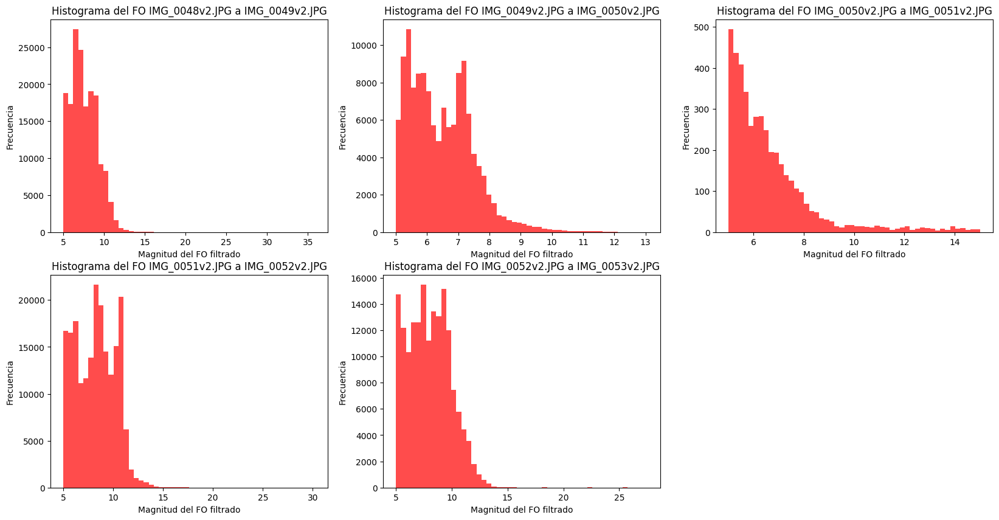

In [ ]:
def plot_filtered_OF_histogram(filtered_flow):

    i = 1
    plt.figure(figsize = (20, 10))

    for (file1, file2), flow in filtered_flow.items():
        magnitudes = np.sqrt(flow[..., 0]**2 + flow[..., 1]**2).flatten()
        magnitudes = magnitudes[magnitudes > 0]

        plt.subplot(2, 3, i)
        plt.hist(magnitudes, bins=50, color='red', alpha=0.7)
        plt.xlabel('Magnitud del FO filtrado')
        plt.ylabel('Frecuencia')
        plt.title(f'Histograma del FO {file1} a {file2}')
        i = i + 1

    plt.show()


plot_filtered_OF_histogram(filtered_flow)

                         Image Pair  Total Movement
0  (IMG_0048v2.JPG, IMG_0049v2.JPG)    1.273062e+06
1  (IMG_0049v2.JPG, IMG_0050v2.JPG)    8.501813e+05
2  (IMG_0050v2.JPG, IMG_0051v2.JPG)    2.888329e+04
3  (IMG_0051v2.JPG, IMG_0052v2.JPG)    1.677701e+06
4  (IMG_0052v2.JPG, IMG_0053v2.JPG)    1.351262e+06


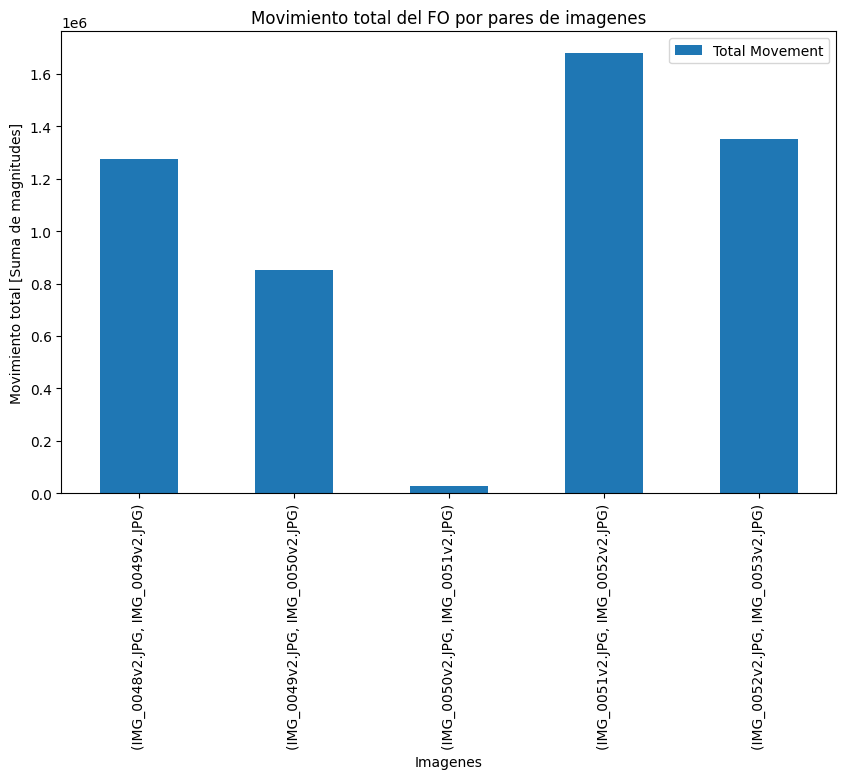

In [ ]:
# Calculo del movimiento y visualizacion de las magnitudes en tabla de Pandas

import pandas as pd

def compute_total_movement(filtered_flow):
    total_movement = {}

    for key, flow in filtered_flow.items():
        magnitudes = np.sqrt(flow[..., 0]**2 + flow[..., 1]**2)
        total_movement[key] = np.sum(magnitudes)

    return total_movement

total_movement = compute_total_movement(filtered_flow)


df = pd.DataFrame(list(total_movement.items()), columns=['Image Pair', 'Total Movement'])
print(df)
df.plot(x='Image Pair', y='Total Movement', kind='bar', figsize=(10, 6))
plt.title('Movimiento total del FO por pares de imagenes')
plt.xlabel('Imagenes')
plt.ylabel('Movimiento total [Suma de magnitudes]')
plt.show()
